**Swin Factorizer, FedAvg, ISLES'24**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd, Spacingd, CropForegroundd, RandCropByPosNegLabeld
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from monai.data import list_data_collate
from monai.inferers import SlidingWindowInferer

from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES24 Split Preprocessed"
print(data_dir)

D:/F25-156/ISLES24 Split Preprocessed


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints"
log_dir = "D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

Checkpoints will be saved to: D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints
TensorBoard logs will be saved to: D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

In [7]:
print(torch.__version__)
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

2.5.1+cu121
CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


**MONAI Preprocessing Transforms**

In [8]:
target_shape = (128, 128, 128)

# transform = Compose([
#     LoadImaged(keys=["image", "label"]),
    
#     EnsureChannelFirstd(keys=["image", "label"]),
    
#     Orientationd(keys=["image", "label"], axcodes="RAS"),

#     Spacingd(
#         keys=["image", "label"],
#         pixdim=(1.0, 1.0, 1.0),
#         mode=("bilinear", "nearest")
#     ),

#     # ⭐ Crop based on image, applied to both
#     CropForegroundd(
#         keys=["image", "label"],
#         source_key="image",
#     ),

#     # ⭐ Make uniform shape
#     ResizeWithPadOrCropd(
#         keys=["image", "label"],
#         spatial_size=target_shape
#     ),

#     # Only normalize image
#     NormalizeIntensityd(keys=["image"], nonzero=True)
# ])

#now minimal pre processing is required
transform = Compose([
    LoadImaged(keys=["image", "label"]),
    EnsureChannelFirstd(keys=["image", "label"]),
])

**Dataset Class**

In [9]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


**Load Files and Apply MONAI Transforms**

In [10]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files, transform=None):
        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.transform = transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):
        data = {
            "image": self.dwi_files[idx],
            "label": self.mask_files[idx]
        }

        if self.transform:
            data = self.transform(data)

        image = data["image"].float()
        mask = data["label"].long()

        return {
            "image": image,
            "mask": mask
        }

**Split into “Clients” (Federated Simulation)**


Client 0
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 40 | Image shape: (512, 512, 83) | Mask shape: (512, 512, 83) | Mask values: tensor([0., 1.], dtype=torch.float64)


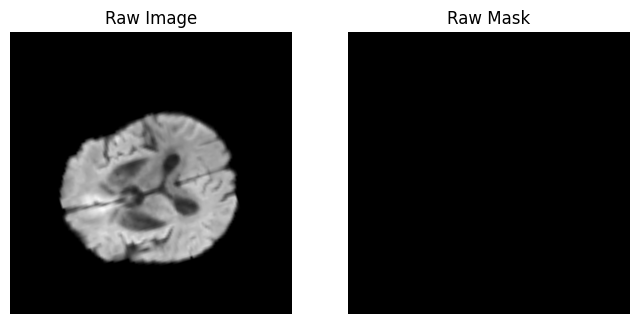

Sample 7 | Image shape: (512, 553, 70) | Mask shape: (512, 553, 70) | Mask values: tensor([0., 1.], dtype=torch.float64)


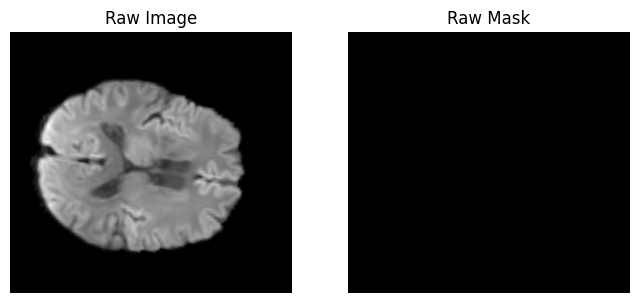


🟢 PREPROCESSED SAMPLES
Sample 40 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0])


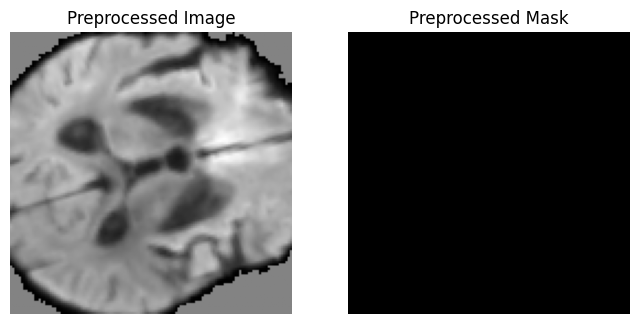

Sample 7 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


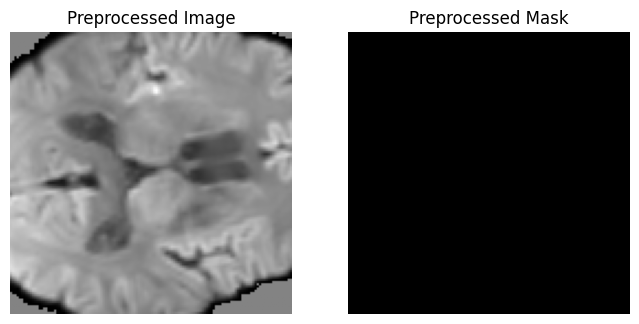


Client 0 dataset size: 50

Client 1
Original samples: 50 | Preprocessed samples: 50

🔵 RAW SAMPLES
Sample 1 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


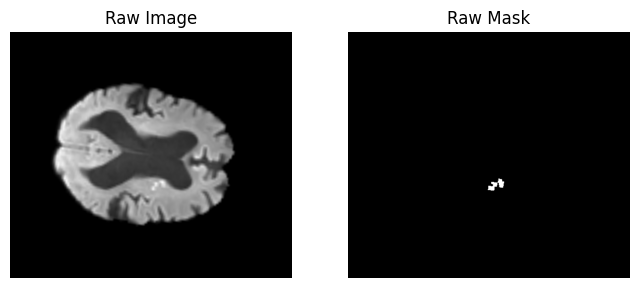

Sample 47 | Image shape: (512, 587, 69) | Mask shape: (512, 587, 69) | Mask values: tensor([0., 1.], dtype=torch.float64)


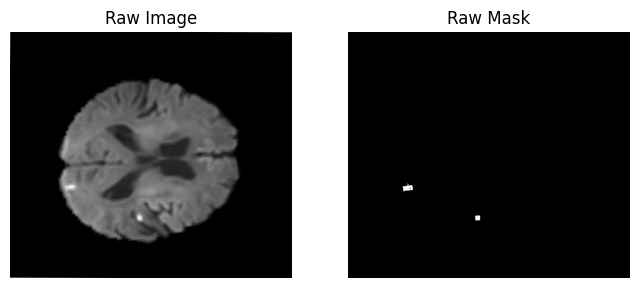


🟢 PREPROCESSED SAMPLES
Sample 1 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


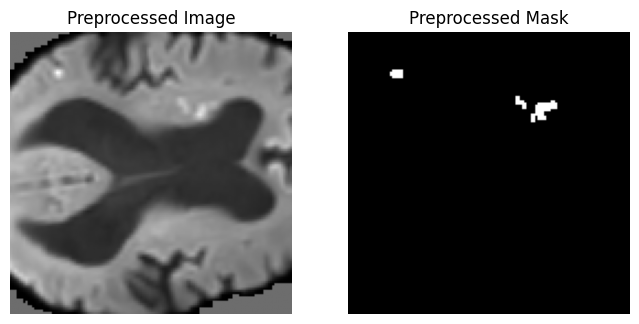

Sample 47 | Image shape: (128, 128, 128) | Mask shape: (128, 128, 128) | Mask values: tensor([0, 1])


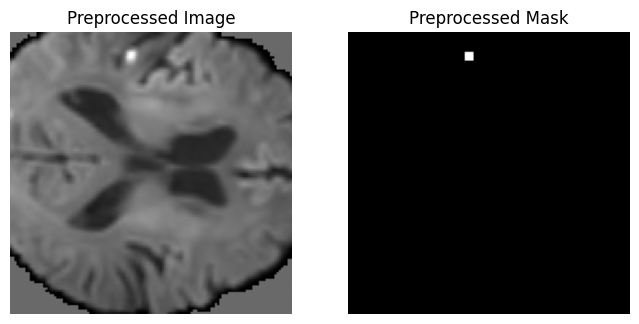


Client 1 dataset size: 50


In [11]:

original_root = "D:/F25-156/ISLES24 Split"
processed_root = "D:/F25-156/ISLES24 Split Preprocessed"

num_clients = 2
client_datasets = []

# -----------------------------
# Loop over clients
# -----------------------------
for i in range(num_clients):

    print("\n" + "="*60)
    print(f"Client {i}")
    print("="*60)

    # -----------------------------
    # ORIGINAL (raw split)
    # -----------------------------
    orig_img_dir = os.path.join(original_root, "train", f"client_{i}", "DWI")
    orig_mask_dir = os.path.join(original_root, "train", f"client_{i}", "masks")

    dwi_files = sorted(glob(os.path.join(orig_img_dir, "*.nii*")))
    mask_files = sorted(glob(os.path.join(orig_mask_dir, "*.nii*")))

    # -----------------------------
    # PREPROCESSED
    # -----------------------------
    proc_img_dir = os.path.join(processed_root, "train", f"client_{i}", "DWI")
    proc_mask_dir = os.path.join(processed_root, "train", f"client_{i}", "masks")

    proc_dwi = sorted(glob(os.path.join(proc_img_dir, "*.nii*")))
    proc_mask = sorted(glob(os.path.join(proc_mask_dir, "*.nii*")))

    print(f"Original samples: {len(dwi_files)} | Preprocessed samples: {len(proc_dwi)}")

    # -----------------------------
    # Pick random samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)

    # =========================================================
    # RAW VISUALIZATION
    # =========================================================
    print("\n🔵 RAW SAMPLES")
    for idx in sample_indices:

        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()

        print(
            f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | "
            f"Mask values: {torch.unique(torch.tensor(mask))}"
        )

        mid = img.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid], cmap="gray")
        plt.title("Raw Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid], cmap="gray")
        plt.title("Raw Mask")
        plt.axis("off")
        plt.show()

    # =========================================================
    # PREPROCESSED VISUALIZATION
    # =========================================================
    print("\n🟢 PREPROCESSED SAMPLES")

    # dataset uses ONLY minimal transform
    ds = ISLESDataset(
        dwi_files=proc_dwi,
        mask_files=proc_mask,
        transform=transform,
    )

    client_datasets.append(ds)

    for idx in sample_indices:

        sample = ds[idx]

        img_proc = sample["image"][0].numpy()
        mask_proc = sample["mask"][0].numpy()

        print(
            f"Sample {idx} | Image shape: {img_proc.shape} | "
            f"Mask shape: {mask_proc.shape} | Mask values: {torch.unique(sample['mask'])}"
        )

        mid = img_proc.shape[2] // 2

        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Image")
        plt.axis("off")

        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid], cmap="gray")
        plt.title("Preprocessed Mask")
        plt.axis("off")
        plt.show()

    print(f"\nClient {i} dataset size: {len(ds)}")

**Validation Set**

In [12]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    transform=transform,
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 20


In [13]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


## Swin Factorizer

In [15]:
!pip install git+https://github.com/pashtari/factorizer.git

  Cloning https://github.com/pashtari/factorizer.git to C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\pip-req-build-792nng7r
  Resolved https://github.com/pashtari/factorizer.git to commit 9adcc5d3c5178d458f5720125ce450e7696f1e09
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'
   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   --------------------------- ------------ 6.8/9.9 MB 42.0 MB/s eta 0:00:01
   ---------------------------- ----------- 7.1/9.9 MB 19.0 MB/s eta 0:00:01
   ------------------------------- -------- 7.9/9.9 MB 13.9 MB/s eta 0:00:01
   ------------------------------------- -- 9.2/9.9 MB 11.7 MB/s eta 0:00:01
   ---------------------------------------- 9.9/9.9 MB 10.3 MB/s  

  Running command git clone --filter=blob:none --quiet https://github.com/pashtari/factorizer.git 'C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\pip-req-build-792nng7r'

[notice] A new release of pip is available: 26.0.1 -> 26.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [16]:
import factorizer as ft

In [17]:
def create_model():
    model = ft.Factorizer(
        in_channels=1,
        out_channels=1,
        spatial_size=target_shape,
        encoder_depth=(1, 1, 1, 1),
        encoder_width=(32, 64, 128, 256),
        strides=(1, 2, 2, 2, 2),
        decoder_depth=(1, 1, 1, 1),
        norm=ft.LayerNorm,
        reshape=(ft.SWMatricize, {'head_dim': 8, 'patch_size': 2}),
        act=nn.ReLU,
        factorize=ft.NMF, 
        rank=1,
        num_iters=3,
        init="uniform",
        solver="hals",
        mlp_ratio=2,
        dropout=0.1
    ).to(device)
    print(model)
    return model

**Client Class**

In [18]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True, collate_fn=list_data_collate)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0
        
        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [19]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = {}

        for key in client_params_list[0].keys():
            param = client_params_list[0][key]

            # Only average floating point tensors
            if torch.is_floating_point(param):
                new_params[key] = param.clone()

                for i in range(1, len(client_params_list)):
                    # prevent device inconsistency- if client tensors are on different devices (CPU vs GPU), this can crash:
                    new_params[key] += client_params_list[i][key].to(param.device)

                new_params[key] /= len(client_params_list)

            else:
                # Copy non-float params (int, bool, etc.) directly
                new_params[key] = param.clone()

        self.global_model.load_state_dict(new_params)
    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [20]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)
                

**Federated Training loop**

In [ ]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:                                                                                                                      
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7835 | Dice: 0.0204 | IoU: 0.0103 | HD95: 80.4321


Client 0 | Epoch 2/20 | Loss: 0.5967 | Dice: 0.2598 | IoU: 0.1493 | HD95: 74.7173


Client 0 | Epoch 3/20 | Loss: 0.5412 | Dice: 0.2870 | IoU: 0.1676 | HD95: 71.9379


Client 0 | Epoch 4/20 | Loss: 0.5300 | Dice: 0.3009 | IoU: 0.1771 | HD95: 70.9608


Client 0 | Epoch 5/20 | Loss: 0.5311 | Dice: 0.3023 | IoU: 0.1781 | HD95: 71.2058


Client 0 | Epoch 6/20 | Loss: 0.5262 | Dice: 0.3107 | IoU: 0.1839 | HD95: 67.4185


Client 0 | Epoch 7/20 | Loss: 0.5061 | Dice: 0.3343 | IoU: 0.2007 | HD95: 66.5741


Client 0 | Epoch 8/20 | Loss: 0.4845 | Dice: 0.3672 | IoU: 0.2249 | HD95: 66.1360


Client 0 | Epoch 9/20 | Loss: 0.4818 | Dice: 0.3663 | IoU: 0.2242 | HD95: 67.2174


Client 0 | Epoch 10/20 | Loss: 0.4551 | Dice: 0.3980 | IoU: 0.2484 | HD95: 63.1950


Client 0 | Epoch 11/20 | Loss: 0.4626 | Dice: 0.3919 | IoU: 0.2437 | HD95: 60.9526


Client 0 | Epoch 12/20 | Loss: 0.4874 | Dice: 0.3556 | IoU: 0.2163 | HD95: 69.5955


Client 0 | Epoch 13/20 | Loss: 0.4564 | Dice: 0.3969 | IoU: 0.2476 | HD95: 66.5158


Client 0 | Epoch 14/20 | Loss: 0.4406 | Dice: 0.4216 | IoU: 0.2671 | HD95: 60.0262


Client 0 | Epoch 15/20 | Loss: 0.4029 | Dice: 0.4695 | IoU: 0.3068 | HD95: 49.8631


Client 0 | Epoch 16/20 | Loss: 0.4071 | Dice: 0.4650 | IoU: 0.3029 | HD95: 57.4454


Client 0 | Epoch 17/20 | Loss: 0.4093 | Dice: 0.4620 | IoU: 0.3004 | HD95: 58.4891


Client 0 | Epoch 18/20 | Loss: 0.3893 | Dice: 0.4884 | IoU: 0.3231 | HD95: 48.1036


Client 0 | Epoch 19/20 | Loss: 0.3508 | Dice: 0.5450 | IoU: 0.3745 | HD95: 43.8122


Clients Training:  50%|█████     | 1/2 [25:30<25:30, 1530.70s/it]

Client 0 | Epoch 20/20 | Loss: 0.3532 | Dice: 0.5380 | IoU: 0.3680 | HD95: 43.4558
Client 0 | Loss=0.4798 | Dice=0.5380 | IoU=0.3680 | HD95=43.4558


Client 1 | Epoch 1/20 | Loss: 0.7921 | Dice: 0.0005 | IoU: 0.0002 | HD95: 88.0044


Client 1 | Epoch 2/20 | Loss: 0.6094 | Dice: 0.2034 | IoU: 0.1132 | HD95: 73.0477


Client 1 | Epoch 3/20 | Loss: 0.5634 | Dice: 0.2625 | IoU: 0.1511 | HD95: 75.4760


Client 1 | Epoch 4/20 | Loss: 0.5664 | Dice: 0.2568 | IoU: 0.1473 | HD95: 75.6112


Client 1 | Epoch 5/20 | Loss: 0.5500 | Dice: 0.2821 | IoU: 0.1642 | HD95: 71.2017


Client 1 | Epoch 6/20 | Loss: 0.5281 | Dice: 0.3140 | IoU: 0.1863 | HD95: 72.0249


Client 1 | Epoch 7/20 | Loss: 0.5079 | Dice: 0.3425 | IoU: 0.2066 | HD95: 67.3057


Client 1 | Epoch 8/20 | Loss: 0.5186 | Dice: 0.3252 | IoU: 0.1942 | HD95: 69.8916


Client 1 | Epoch 9/20 | Loss: 0.4909 | Dice: 0.3565 | IoU: 0.2169 | HD95: 69.1761


Client 1 | Epoch 10/20 | Loss: 0.4611 | Dice: 0.4007 | IoU: 0.2506 | HD95: 64.9782


Client 1 | Epoch 11/20 | Loss: 0.4490 | Dice: 0.4109 | IoU: 0.2586 | HD95: 64.1477


Client 1 | Epoch 12/20 | Loss: 0.4388 | Dice: 0.4303 | IoU: 0.2741 | HD95: 60.4528


Client 1 | Epoch 13/20 | Loss: 0.4416 | Dice: 0.4300 | IoU: 0.2739 | HD95: 53.2350


Client 1 | Epoch 14/20 | Loss: 0.3969 | Dice: 0.4907 | IoU: 0.3251 | HD95: 52.0597


Client 1 | Epoch 15/20 | Loss: 0.3867 | Dice: 0.5022 | IoU: 0.3353 | HD95: 44.5130


Client 1 | Epoch 16/20 | Loss: 0.3828 | Dice: 0.5078 | IoU: 0.3403 | HD95: 49.7150


Client 1 | Epoch 17/20 | Loss: 0.3591 | Dice: 0.5386 | IoU: 0.3685 | HD95: 44.1705


Client 1 | Epoch 18/20 | Loss: 0.3583 | Dice: 0.5415 | IoU: 0.3712 | HD95: 38.4403


Client 1 | Epoch 19/20 | Loss: 0.3768 | Dice: 0.5144 | IoU: 0.3463 | HD95: 42.9406


Client 1 Epochs: 100%|██████████| 20/20 [25:20<00:00, 76.03s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.3437 | Dice: 0.5594 | IoU: 0.3884 | HD95: 39.5185
Client 1 | Loss=0.4761 | Dice=0.5594 | IoU=0.3884 | HD95=39.5185


Best global model updated with Dice=0.5223
Global | Val Loss=0.3630 | Dice=0.5223 | IoU=0.3535 | HD95=31.8981
Checkpoint saved for round 1 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3827 | Dice: 0.4949 | IoU: 0.3288 | HD95: 43.4071


Client 0 | Epoch 2/20 | Loss: 0.3818 | Dice: 0.5003 | IoU: 0.3336 | HD95: 53.0480


Client 0 | Epoch 3/20 | Loss: 0.3371 | Dice: 0.5590 | IoU: 0.3880 | HD95: 38.0202


Client 0 | Epoch 4/20 | Loss: 0.3513 | Dice: 0.5412 | IoU: 0.3710 | HD95: 40.9554


Client 0 | Epoch 5/20 | Loss: 0.3384 | Dice: 0.5559 | IoU: 0.3849 | HD95: 43.4604


Client 0 | Epoch 6/20 | Loss: 0.3186 | Dice: 0.5848 | IoU: 0.4132 | HD95: 35.0678


Client 0 | Epoch 7/20 | Loss: 0.3288 | Dice: 0.5715 | IoU: 0.4001 | HD95: 36.5108


Client 0 | Epoch 8/20 | Loss: 0.3242 | Dice: 0.5757 | IoU: 0.4042 | HD95: 33.2114


Client 0 | Epoch 9/20 | Loss: 0.3013 | Dice: 0.6087 | IoU: 0.4375 | HD95: 30.8731


Client 0 | Epoch 10/20 | Loss: 0.3007 | Dice: 0.6104 | IoU: 0.4392 | HD95: 30.4300


Client 0 | Epoch 11/20 | Loss: 0.3103 | Dice: 0.5961 | IoU: 0.4246 | HD95: 37.2384


Client 0 | Epoch 12/20 | Loss: 0.2972 | Dice: 0.6168 | IoU: 0.4459 | HD95: 32.8693


Client 0 | Epoch 13/20 | Loss: 0.2846 | Dice: 0.6320 | IoU: 0.4620 | HD95: 23.7216


Client 0 | Epoch 14/20 | Loss: 0.2795 | Dice: 0.6389 | IoU: 0.4694 | HD95: 25.2308


Client 0 | Epoch 15/20 | Loss: 0.2958 | Dice: 0.6162 | IoU: 0.4453 | HD95: 21.9626


Client 0 | Epoch 16/20 | Loss: 0.3038 | Dice: 0.6057 | IoU: 0.4344 | HD95: 31.1486


Client 0 | Epoch 17/20 | Loss: 0.2863 | Dice: 0.6305 | IoU: 0.4604 | HD95: 22.8613


Client 0 | Epoch 18/20 | Loss: 0.2762 | Dice: 0.6445 | IoU: 0.4754 | HD95: 28.3058


Client 0 | Epoch 19/20 | Loss: 0.2623 | Dice: 0.6636 | IoU: 0.4966 | HD95: 19.7936


Clients Training:  50%|█████     | 1/2 [24:46<24:46, 1486.56s/it]

Client 0 | Epoch 20/20 | Loss: 0.2578 | Dice: 0.6702 | IoU: 0.5040 | HD95: 19.8731
Client 0 | Loss=0.3109 | Dice=0.6702 | IoU=0.5040 | HD95=19.8731


Client 1 | Epoch 1/20 | Loss: 0.3677 | Dice: 0.5275 | IoU: 0.3583 | HD95: 42.5660


Client 1 | Epoch 2/20 | Loss: 0.4160 | Dice: 0.4540 | IoU: 0.2936 | HD95: 42.9475


Client 1 | Epoch 3/20 | Loss: 0.3602 | Dice: 0.5379 | IoU: 0.3679 | HD95: 47.2560


Client 1 | Epoch 4/20 | Loss: 0.3295 | Dice: 0.5795 | IoU: 0.4080 | HD95: 35.4734


Client 1 | Epoch 5/20 | Loss: 0.3221 | Dice: 0.5895 | IoU: 0.4179 | HD95: 31.9024


Client 1 | Epoch 6/20 | Loss: 0.3066 | Dice: 0.6106 | IoU: 0.4394 | HD95: 28.1189


Client 1 | Epoch 7/20 | Loss: 0.3210 | Dice: 0.5890 | IoU: 0.4175 | HD95: 36.2301


Client 1 | Epoch 8/20 | Loss: 0.3008 | Dice: 0.6193 | IoU: 0.4485 | HD95: 30.9058


Client 1 | Epoch 9/20 | Loss: 0.3001 | Dice: 0.6194 | IoU: 0.4487 | HD95: 28.5455


Client 1 | Epoch 10/20 | Loss: 0.3057 | Dice: 0.6112 | IoU: 0.4401 | HD95: 27.6225


Client 1 | Epoch 11/20 | Loss: 0.2913 | Dice: 0.6300 | IoU: 0.4599 | HD95: 30.7159


Client 1 | Epoch 12/20 | Loss: 0.2978 | Dice: 0.6217 | IoU: 0.4510 | HD95: 27.7777


Client 1 | Epoch 13/20 | Loss: 0.2867 | Dice: 0.6386 | IoU: 0.4691 | HD95: 27.6310


Client 1 | Epoch 14/20 | Loss: 0.2903 | Dice: 0.6334 | IoU: 0.4635 | HD95: 24.5374


Client 1 | Epoch 15/20 | Loss: 0.2711 | Dice: 0.6603 | IoU: 0.4929 | HD95: 25.7952


Client 1 | Epoch 16/20 | Loss: 0.2757 | Dice: 0.6528 | IoU: 0.4846 | HD95: 25.3531


Client 1 | Epoch 17/20 | Loss: 0.2699 | Dice: 0.6611 | IoU: 0.4938 | HD95: 21.0738


Client 1 | Epoch 18/20 | Loss: 0.2589 | Dice: 0.6772 | IoU: 0.5119 | HD95: 25.5333


Client 1 | Epoch 19/20 | Loss: 0.2628 | Dice: 0.6736 | IoU: 0.5079 | HD95: 21.4818


Client 1 Epochs: 100%|██████████| 20/20 [24:50<00:00, 74.51s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2602 | Dice: 0.6749 | IoU: 0.5093 | HD95: 23.8273
Client 1 | Loss=0.3047 | Dice=0.6749 | IoU=0.5093 | HD95=23.8273


Best global model updated with Dice=0.6446
Global | Val Loss=0.2702 | Dice=0.6446 | IoU=0.4756 | HD95=26.4106
Checkpoint saved for round 2 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2780 | Dice: 0.6395 | IoU: 0.4701 | HD95: 27.8360


Client 0 | Epoch 2/20 | Loss: 0.3185 | Dice: 0.5862 | IoU: 0.4146 | HD95: 32.2269


Client 0 | Epoch 3/20 | Loss: 0.2855 | Dice: 0.6291 | IoU: 0.4589 | HD95: 26.2240


Client 0 | Epoch 4/20 | Loss: 0.2615 | Dice: 0.6630 | IoU: 0.4959 | HD95: 24.9554


Client 0 | Epoch 5/20 | Loss: 0.2686 | Dice: 0.6537 | IoU: 0.4855 | HD95: 19.8488


Client 0 | Epoch 6/20 | Loss: 0.2596 | Dice: 0.6659 | IoU: 0.4991 | HD95: 22.5192


Client 0 | Epoch 7/20 | Loss: 0.2834 | Dice: 0.6325 | IoU: 0.4625 | HD95: 31.9878


Client 0 | Epoch 8/20 | Loss: 0.2665 | Dice: 0.6572 | IoU: 0.4894 | HD95: 26.3219


Client 0 | Epoch 9/20 | Loss: 0.2550 | Dice: 0.6745 | IoU: 0.5089 | HD95: 22.4971


Client 0 | Epoch 10/20 | Loss: 0.2505 | Dice: 0.6799 | IoU: 0.5151 | HD95: 14.0757


Client 0 | Epoch 11/20 | Loss: 0.2602 | Dice: 0.6660 | IoU: 0.4992 | HD95: 20.5135


Client 0 | Epoch 12/20 | Loss: 0.2412 | Dice: 0.6937 | IoU: 0.5311 | HD95: 15.9484


Client 0 | Epoch 13/20 | Loss: 0.2329 | Dice: 0.7040 | IoU: 0.5432 | HD95: 16.7940


Client 0 | Epoch 14/20 | Loss: 0.2332 | Dice: 0.7041 | IoU: 0.5433 | HD95: 14.3074


Client 0 | Epoch 15/20 | Loss: 0.2559 | Dice: 0.6733 | IoU: 0.5075 | HD95: 20.8746


Client 0 | Epoch 16/20 | Loss: 0.2445 | Dice: 0.6888 | IoU: 0.5253 | HD95: 22.0609


Client 0 | Epoch 17/20 | Loss: 0.2290 | Dice: 0.7106 | IoU: 0.5511 | HD95: 18.9218


Client 0 | Epoch 18/20 | Loss: 0.2319 | Dice: 0.7062 | IoU: 0.5458 | HD95: 18.0687


Client 0 | Epoch 19/20 | Loss: 0.2183 | Dice: 0.7242 | IoU: 0.5676 | HD95: 14.5977


Clients Training:  50%|█████     | 1/2 [24:34<24:34, 1474.68s/it]

Client 0 | Epoch 20/20 | Loss: 0.2217 | Dice: 0.7194 | IoU: 0.5618 | HD95: 19.0152
Client 0 | Loss=0.2548 | Dice=0.7194 | IoU=0.5618 | HD95=19.0152


Client 1 | Epoch 1/20 | Loss: 0.2752 | Dice: 0.6533 | IoU: 0.4851 | HD95: 26.8246


Client 1 | Epoch 2/20 | Loss: 0.2663 | Dice: 0.6681 | IoU: 0.5017 | HD95: 23.2748


Client 1 | Epoch 3/20 | Loss: 0.2611 | Dice: 0.6748 | IoU: 0.5092 | HD95: 23.2767


Client 1 | Epoch 4/20 | Loss: 0.2526 | Dice: 0.6866 | IoU: 0.5228 | HD95: 18.0170


Client 1 | Epoch 5/20 | Loss: 0.2492 | Dice: 0.6911 | IoU: 0.5280 | HD95: 19.5330


Client 1 | Epoch 6/20 | Loss: 0.2440 | Dice: 0.6990 | IoU: 0.5373 | HD95: 18.6094


Client 1 | Epoch 7/20 | Loss: 0.2519 | Dice: 0.6884 | IoU: 0.5249 | HD95: 18.5582


Client 1 | Epoch 8/20 | Loss: 0.2651 | Dice: 0.6686 | IoU: 0.5021 | HD95: 22.7273


Client 1 | Epoch 9/20 | Loss: 0.2520 | Dice: 0.6886 | IoU: 0.5251 | HD95: 16.7757


Client 1 | Epoch 10/20 | Loss: 0.2495 | Dice: 0.6925 | IoU: 0.5296 | HD95: 18.3754


Client 1 | Epoch 11/20 | Loss: 0.2586 | Dice: 0.6762 | IoU: 0.5108 | HD95: 22.2102


Client 1 | Epoch 12/20 | Loss: 0.2423 | Dice: 0.7008 | IoU: 0.5394 | HD95: 14.4714


Client 1 | Epoch 13/20 | Loss: 0.2335 | Dice: 0.7146 | IoU: 0.5560 | HD95: 15.1816


Client 1 | Epoch 14/20 | Loss: 0.2219 | Dice: 0.7296 | IoU: 0.5743 | HD95: 15.2756


Client 1 | Epoch 15/20 | Loss: 0.2257 | Dice: 0.7246 | IoU: 0.5681 | HD95: 14.9500


Client 1 | Epoch 16/20 | Loss: 0.2164 | Dice: 0.7376 | IoU: 0.5842 | HD95: 15.7195


Client 1 | Epoch 17/20 | Loss: 0.2160 | Dice: 0.7374 | IoU: 0.5841 | HD95: 12.7640


Client 1 | Epoch 18/20 | Loss: 0.2151 | Dice: 0.7391 | IoU: 0.5862 | HD95: 17.2064


Client 1 | Epoch 19/20 | Loss: 0.2104 | Dice: 0.7464 | IoU: 0.5954 | HD95: 10.5426


Client 1 Epochs: 100%|██████████| 20/20 [24:43<00:00, 74.17s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.2556 | Dice: 0.6872 | IoU: 0.5234 | HD95: 19.5396
Client 1 | Loss=0.2431 | Dice=0.6872 | IoU=0.5234 | HD95=19.5396


Global | Val Loss=0.4393 | Dice=0.4450 | IoU=0.2862 | HD95=25.5183
Checkpoint saved for round 3 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round3.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 4 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2821 | Dice: 0.6354 | IoU: 0.4656 | HD95: 27.4140


Client 0 | Epoch 2/20 | Loss: 0.2633 | Dice: 0.6629 | IoU: 0.4958 | HD95: 24.9241


Client 0 | Epoch 3/20 | Loss: 0.2481 | Dice: 0.6824 | IoU: 0.5180 | HD95: 17.2943


Client 0 | Epoch 4/20 | Loss: 0.2303 | Dice: 0.7073 | IoU: 0.5472 | HD95: 16.0319


Client 0 | Epoch 5/20 | Loss: 0.2199 | Dice: 0.7223 | IoU: 0.5653 | HD95: 16.5740


Client 0 | Epoch 6/20 | Loss: 0.2204 | Dice: 0.7209 | IoU: 0.5636 | HD95: 17.5034


Client 0 | Epoch 7/20 | Loss: 0.2304 | Dice: 0.7067 | IoU: 0.5465 | HD95: 20.5352


Client 0 | Epoch 8/20 | Loss: 0.2289 | Dice: 0.7085 | IoU: 0.5486 | HD95: 17.2500


Client 0 | Epoch 9/20 | Loss: 0.2108 | Dice: 0.7341 | IoU: 0.5799 | HD95: 13.0526


Client 0 | Epoch 10/20 | Loss: 0.2053 | Dice: 0.7412 | IoU: 0.5888 | HD95: 15.4593


Client 0 | Epoch 11/20 | Loss: 0.2033 | Dice: 0.7439 | IoU: 0.5922 | HD95: 14.5963


Client 0 | Epoch 12/20 | Loss: 0.2301 | Dice: 0.7075 | IoU: 0.5474 | HD95: 20.7633


Client 0 | Epoch 13/20 | Loss: 0.2710 | Dice: 0.6499 | IoU: 0.4814 | HD95: 21.9368


Client 0 | Epoch 14/20 | Loss: 0.2135 | Dice: 0.7321 | IoU: 0.5774 | HD95: 14.0512


Client 0 | Epoch 15/20 | Loss: 0.2094 | Dice: 0.7376 | IoU: 0.5843 | HD95: 19.4417


Client 0 | Epoch 16/20 | Loss: 0.2496 | Dice: 0.6847 | IoU: 0.5206 | HD95: 21.3241


Client 0 | Epoch 17/20 | Loss: 0.2076 | Dice: 0.7409 | IoU: 0.5884 | HD95: 16.6458


Client 0 | Epoch 18/20 | Loss: 0.2083 | Dice: 0.7390 | IoU: 0.5861 | HD95: 15.9847


Client 0 | Epoch 19/20 | Loss: 0.2004 | Dice: 0.7488 | IoU: 0.5985 | HD95: 18.6039


Clients Training:  50%|█████     | 1/2 [24:35<24:35, 1475.80s/it]

Client 0 | Epoch 20/20 | Loss: 0.2179 | Dice: 0.7246 | IoU: 0.5681 | HD95: 21.0124
Client 0 | Loss=0.2275 | Dice=0.7246 | IoU=0.5681 | HD95=21.0124


Client 1 | Epoch 1/20 | Loss: 0.3085 | Dice: 0.6101 | IoU: 0.4389 | HD95: 30.3754


Client 1 | Epoch 2/20 | Loss: 0.2772 | Dice: 0.6519 | IoU: 0.4836 | HD95: 21.0045


Client 1 | Epoch 3/20 | Loss: 0.2456 | Dice: 0.6967 | IoU: 0.5346 | HD95: 18.4259


Client 1 | Epoch 4/20 | Loss: 0.2261 | Dice: 0.7243 | IoU: 0.5678 | HD95: 15.3503


Client 1 | Epoch 5/20 | Loss: 0.2187 | Dice: 0.7340 | IoU: 0.5798 | HD95: 14.8548


Client 1 | Epoch 6/20 | Loss: 0.2160 | Dice: 0.7388 | IoU: 0.5858 | HD95: 11.7992


Client 1 | Epoch 7/20 | Loss: 0.2123 | Dice: 0.7435 | IoU: 0.5918 | HD95: 12.4704


Client 1 | Epoch 8/20 | Loss: 0.2266 | Dice: 0.7242 | IoU: 0.5677 | HD95: 19.8742


Client 1 | Epoch 9/20 | Loss: 0.2095 | Dice: 0.7486 | IoU: 0.5982 | HD95: 14.1073


Client 1 | Epoch 10/20 | Loss: 0.2086 | Dice: 0.7487 | IoU: 0.5983 | HD95: 12.5406


Client 1 | Epoch 11/20 | Loss: 0.1973 | Dice: 0.7645 | IoU: 0.6188 | HD95: 8.9599


Client 1 | Epoch 12/20 | Loss: 0.1952 | Dice: 0.7673 | IoU: 0.6224 | HD95: 9.5112


Client 1 | Epoch 13/20 | Loss: 0.1914 | Dice: 0.7728 | IoU: 0.6298 | HD95: 8.4075


Client 1 | Epoch 14/20 | Loss: 0.1936 | Dice: 0.7693 | IoU: 0.6251 | HD95: 9.6549


Client 1 | Epoch 15/20 | Loss: 0.2083 | Dice: 0.7485 | IoU: 0.5980 | HD95: 9.3846


Client 1 | Epoch 16/20 | Loss: 0.1959 | Dice: 0.7657 | IoU: 0.6203 | HD95: 12.6155


Client 1 | Epoch 17/20 | Loss: 0.1875 | Dice: 0.7777 | IoU: 0.6363 | HD95: 9.4618


Client 1 | Epoch 18/20 | Loss: 0.1872 | Dice: 0.7785 | IoU: 0.6374 | HD95: 8.8843


Client 1 | Epoch 19/20 | Loss: 0.1862 | Dice: 0.7794 | IoU: 0.6386 | HD95: 8.4447


Client 1 Epochs: 100%|██████████| 20/20 [24:45<00:00, 74.30s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1862 | Dice: 0.7801 | IoU: 0.6395 | HD95: 9.6599
Client 1 | Loss=0.2139 | Dice=0.7801 | IoU=0.6395 | HD95=9.6599


Best global model updated with Dice=0.6866
Global | Val Loss=0.2364 | Dice=0.6866 | IoU=0.5227 | HD95=22.5432
Checkpoint saved for round 4 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2116 | Dice: 0.7321 | IoU: 0.5774 | HD95: 16.9698


Client 0 | Epoch 2/20 | Loss: 0.2008 | Dice: 0.7498 | IoU: 0.5998 | HD95: 13.8183


Client 0 | Epoch 3/20 | Loss: 0.2001 | Dice: 0.7492 | IoU: 0.5990 | HD95: 11.4792


Client 0 | Epoch 4/20 | Loss: 0.2265 | Dice: 0.7131 | IoU: 0.5541 | HD95: 17.3845


Client 0 | Epoch 5/20 | Loss: 0.2167 | Dice: 0.7297 | IoU: 0.5745 | HD95: 15.5487


Client 0 | Epoch 6/20 | Loss: 0.1895 | Dice: 0.7639 | IoU: 0.6180 | HD95: 13.2939


Client 0 | Epoch 7/20 | Loss: 0.1854 | Dice: 0.7699 | IoU: 0.6259 | HD95: 8.7105


Client 0 | Epoch 8/20 | Loss: 0.1875 | Dice: 0.7667 | IoU: 0.6216 | HD95: 10.9136


Client 0 | Epoch 9/20 | Loss: 0.1788 | Dice: 0.7793 | IoU: 0.6384 | HD95: 10.1724


Client 0 | Epoch 10/20 | Loss: 0.2379 | Dice: 0.6990 | IoU: 0.5373 | HD95: 25.2512


Client 0 | Epoch 11/20 | Loss: 0.2238 | Dice: 0.7171 | IoU: 0.5590 | HD95: 22.2047


Client 0 | Epoch 12/20 | Loss: 0.1915 | Dice: 0.7618 | IoU: 0.6152 | HD95: 11.8422


Client 0 | Epoch 13/20 | Loss: 0.1843 | Dice: 0.7718 | IoU: 0.6284 | HD95: 8.0276


Client 0 | Epoch 14/20 | Loss: 0.1788 | Dice: 0.7783 | IoU: 0.6371 | HD95: 8.7886


Client 0 | Epoch 15/20 | Loss: 0.1779 | Dice: 0.7794 | IoU: 0.6385 | HD95: 11.2642


Client 0 | Epoch 16/20 | Loss: 0.1784 | Dice: 0.7792 | IoU: 0.6382 | HD95: 11.6945


Client 0 | Epoch 17/20 | Loss: 0.1750 | Dice: 0.7833 | IoU: 0.6438 | HD95: 11.2410


Client 0 | Epoch 18/20 | Loss: 0.2774 | Dice: 0.6424 | IoU: 0.4732 | HD95: 21.5900


Client 0 | Epoch 19/20 | Loss: 0.2302 | Dice: 0.7081 | IoU: 0.5481 | HD95: 21.9301


Clients Training:  50%|█████     | 1/2 [24:33<24:33, 1473.09s/it]

Client 0 | Epoch 20/20 | Loss: 0.1840 | Dice: 0.7716 | IoU: 0.6282 | HD95: 11.8681
Client 0 | Loss=0.2018 | Dice=0.7716 | IoU=0.6282 | HD95=11.8681


Client 1 | Epoch 1/20 | Loss: 0.2064 | Dice: 0.7514 | IoU: 0.6018 | HD95: 11.1343


Client 1 | Epoch 2/20 | Loss: 0.2229 | Dice: 0.7272 | IoU: 0.5713 | HD95: 18.9965


Client 1 | Epoch 3/20 | Loss: 0.2140 | Dice: 0.7400 | IoU: 0.5874 | HD95: 14.9881


Client 1 | Epoch 4/20 | Loss: 0.1912 | Dice: 0.7726 | IoU: 0.6294 | HD95: 11.5310


Client 1 | Epoch 5/20 | Loss: 0.1857 | Dice: 0.7800 | IoU: 0.6393 | HD95: 8.5106


Client 1 | Epoch 6/20 | Loss: 0.1831 | Dice: 0.7838 | IoU: 0.6445 | HD95: 10.1367


Client 1 | Epoch 7/20 | Loss: 0.1819 | Dice: 0.7859 | IoU: 0.6473 | HD95: 8.9530


Client 1 | Epoch 8/20 | Loss: 0.1784 | Dice: 0.7901 | IoU: 0.6531 | HD95: 7.3791


Client 1 | Epoch 9/20 | Loss: 0.1792 | Dice: 0.7888 | IoU: 0.6512 | HD95: 8.4465


Client 1 | Epoch 10/20 | Loss: 0.1728 | Dice: 0.7982 | IoU: 0.6642 | HD95: 6.3603


Client 1 | Epoch 11/20 | Loss: 0.1728 | Dice: 0.7980 | IoU: 0.6639 | HD95: 7.3946


Client 1 | Epoch 12/20 | Loss: 0.1762 | Dice: 0.7935 | IoU: 0.6576 | HD95: 6.6803


Client 1 | Epoch 13/20 | Loss: 0.1780 | Dice: 0.7909 | IoU: 0.6541 | HD95: 7.1656


Client 1 | Epoch 14/20 | Loss: 0.1705 | Dice: 0.8019 | IoU: 0.6693 | HD95: 6.4836


Client 1 | Epoch 15/20 | Loss: 0.1812 | Dice: 0.7863 | IoU: 0.6479 | HD95: 10.1169


Client 1 | Epoch 16/20 | Loss: 0.1772 | Dice: 0.7918 | IoU: 0.6554 | HD95: 7.6646


Client 1 | Epoch 17/20 | Loss: 0.1739 | Dice: 0.7972 | IoU: 0.6628 | HD95: 6.7526


Client 1 | Epoch 18/20 | Loss: 0.1680 | Dice: 0.8044 | IoU: 0.6729 | HD95: 6.3855


Client 1 | Epoch 19/20 | Loss: 0.1667 | Dice: 0.8063 | IoU: 0.6755 | HD95: 6.2178


Client 1 Epochs: 100%|██████████| 20/20 [24:40<00:00, 74.02s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1648 | Dice: 0.8093 | IoU: 0.6797 | HD95: 6.0572
Client 1 | Loss=0.1822 | Dice=0.8093 | IoU=0.6797 | HD95=6.0572


Global | Val Loss=0.2829 | Dice=0.6311 | IoU=0.4611 | HD95=18.3952
Checkpoint saved for round 5 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round5.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 6 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1894 | Dice: 0.7631 | IoU: 0.6170 | HD95: 10.4495


Client 0 | Epoch 2/20 | Loss: 0.1810 | Dice: 0.7757 | IoU: 0.6335 | HD95: 11.9473


Client 0 | Epoch 3/20 | Loss: 0.1810 | Dice: 0.7762 | IoU: 0.6342 | HD95: 9.8993


Client 0 | Epoch 4/20 | Loss: 0.1754 | Dice: 0.7833 | IoU: 0.6438 | HD95: 12.3860


Client 0 | Epoch 5/20 | Loss: 0.1724 | Dice: 0.7865 | IoU: 0.6481 | HD95: 9.9331


Client 0 | Epoch 6/20 | Loss: 0.1677 | Dice: 0.7929 | IoU: 0.6568 | HD95: 10.6498


Client 0 | Epoch 7/20 | Loss: 0.1681 | Dice: 0.7927 | IoU: 0.6565 | HD95: 8.4114


Client 0 | Epoch 8/20 | Loss: 0.1679 | Dice: 0.7926 | IoU: 0.6564 | HD95: 9.2431


Client 0 | Epoch 9/20 | Loss: 0.1658 | Dice: 0.7950 | IoU: 0.6598 | HD95: 9.3016


Client 0 | Epoch 10/20 | Loss: 0.1643 | Dice: 0.7969 | IoU: 0.6624 | HD95: 8.8808


Client 0 | Epoch 11/20 | Loss: 0.1596 | Dice: 0.8040 | IoU: 0.6723 | HD95: 8.8574


Client 0 | Epoch 12/20 | Loss: 0.1623 | Dice: 0.8002 | IoU: 0.6669 | HD95: 10.5250


Client 0 | Epoch 13/20 | Loss: 0.1793 | Dice: 0.7780 | IoU: 0.6367 | HD95: 10.0550


Client 0 | Epoch 14/20 | Loss: 0.1660 | Dice: 0.7956 | IoU: 0.6605 | HD95: 7.7824


Client 0 | Epoch 15/20 | Loss: 0.1651 | Dice: 0.7960 | IoU: 0.6611 | HD95: 9.0790


Client 0 | Epoch 16/20 | Loss: 0.1731 | Dice: 0.7845 | IoU: 0.6454 | HD95: 11.7992


Client 0 | Epoch 17/20 | Loss: 0.2404 | Dice: 0.6926 | IoU: 0.5297 | HD95: 19.1288


Client 0 | Epoch 18/20 | Loss: 0.2452 | Dice: 0.6892 | IoU: 0.5257 | HD95: 18.4051


Client 0 | Epoch 19/20 | Loss: 0.1912 | Dice: 0.7620 | IoU: 0.6155 | HD95: 13.6531


Clients Training:  50%|█████     | 1/2 [24:31<24:31, 1471.43s/it]

Client 0 | Epoch 20/20 | Loss: 0.1656 | Dice: 0.7958 | IoU: 0.6609 | HD95: 9.0302
Client 0 | Loss=0.1790 | Dice=0.7958 | IoU=0.6609 | HD95=9.0302


Client 1 | Epoch 1/20 | Loss: 0.2433 | Dice: 0.6981 | IoU: 0.5362 | HD95: 24.3803


Client 1 | Epoch 2/20 | Loss: 0.2158 | Dice: 0.7383 | IoU: 0.5852 | HD95: 15.2664


Client 1 | Epoch 3/20 | Loss: 0.1898 | Dice: 0.7742 | IoU: 0.6315 | HD95: 9.0772


Client 1 | Epoch 4/20 | Loss: 0.1790 | Dice: 0.7890 | IoU: 0.6515 | HD95: 7.9215


Client 1 | Epoch 5/20 | Loss: 0.1767 | Dice: 0.7923 | IoU: 0.6561 | HD95: 10.1610


Client 1 | Epoch 6/20 | Loss: 0.1720 | Dice: 0.7993 | IoU: 0.6657 | HD95: 8.7601


Client 1 | Epoch 7/20 | Loss: 0.1675 | Dice: 0.8055 | IoU: 0.6743 | HD95: 7.9596


Client 1 | Epoch 8/20 | Loss: 0.1645 | Dice: 0.8092 | IoU: 0.6795 | HD95: 6.3966


Client 1 | Epoch 9/20 | Loss: 0.1630 | Dice: 0.8120 | IoU: 0.6835 | HD95: 5.6804


Client 1 | Epoch 10/20 | Loss: 0.1618 | Dice: 0.8135 | IoU: 0.6856 | HD95: 5.7494


Client 1 | Epoch 11/20 | Loss: 0.1595 | Dice: 0.8167 | IoU: 0.6902 | HD95: 5.7406


Client 1 | Epoch 12/20 | Loss: 0.1632 | Dice: 0.8111 | IoU: 0.6823 | HD95: 8.1014


Client 1 | Epoch 13/20 | Loss: 0.1732 | Dice: 0.7977 | IoU: 0.6634 | HD95: 7.5674


Client 1 | Epoch 14/20 | Loss: 0.1610 | Dice: 0.8145 | IoU: 0.6871 | HD95: 6.2498


Client 1 | Epoch 15/20 | Loss: 0.1587 | Dice: 0.8179 | IoU: 0.6919 | HD95: 4.9687


Client 1 | Epoch 16/20 | Loss: 0.1581 | Dice: 0.8187 | IoU: 0.6931 | HD95: 5.3784


Client 1 | Epoch 17/20 | Loss: 0.1554 | Dice: 0.8224 | IoU: 0.6984 | HD95: 5.7350


Client 1 | Epoch 18/20 | Loss: 0.1564 | Dice: 0.8211 | IoU: 0.6965 | HD95: 5.8316


Client 1 | Epoch 19/20 | Loss: 0.1557 | Dice: 0.8221 | IoU: 0.6979 | HD95: 5.8992


Client 1 Epochs: 100%|██████████| 20/20 [24:45<00:00, 74.30s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1613 | Dice: 0.8141 | IoU: 0.6864 | HD95: 7.4624
Client 1 | Loss=0.1718 | Dice=0.8141 | IoU=0.6864 | HD95=7.4624


Global | Val Loss=0.2485 | Dice=0.6709 | IoU=0.5047 | HD95=18.7936
Checkpoint saved for round 6 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1699 | Dice: 0.7900 | IoU: 0.6529 | HD95: 8.6988


Client 0 | Epoch 2/20 | Loss: 0.1722 | Dice: 0.7867 | IoU: 0.6484 | HD95: 8.5331


Client 0 | Epoch 3/20 | Loss: 0.1653 | Dice: 0.7954 | IoU: 0.6603 | HD95: 8.7220


Client 0 | Epoch 4/20 | Loss: 0.1899 | Dice: 0.7620 | IoU: 0.6156 | HD95: 14.5020


Client 0 | Epoch 5/20 | Loss: 0.1642 | Dice: 0.7975 | IoU: 0.6631 | HD95: 7.6498


Client 0 | Epoch 6/20 | Loss: 0.1608 | Dice: 0.8023 | IoU: 0.6698 | HD95: 7.7917


Client 0 | Epoch 7/20 | Loss: 0.1602 | Dice: 0.8025 | IoU: 0.6701 | HD95: 8.4986


Client 0 | Epoch 8/20 | Loss: 0.1589 | Dice: 0.8041 | IoU: 0.6724 | HD95: 7.8993


Client 0 | Epoch 9/20 | Loss: 0.1582 | Dice: 0.8053 | IoU: 0.6740 | HD95: 7.6363


Client 0 | Epoch 10/20 | Loss: 0.1545 | Dice: 0.8107 | IoU: 0.6817 | HD95: 7.2776


Client 0 | Epoch 11/20 | Loss: 0.1534 | Dice: 0.8116 | IoU: 0.6829 | HD95: 7.2297


Client 0 | Epoch 12/20 | Loss: 0.1531 | Dice: 0.8118 | IoU: 0.6832 | HD95: 7.9727


Client 0 | Epoch 13/20 | Loss: 0.1532 | Dice: 0.8118 | IoU: 0.6833 | HD95: 8.7543


Client 0 | Epoch 14/20 | Loss: 0.1518 | Dice: 0.8138 | IoU: 0.6861 | HD95: 7.2214


Client 0 | Epoch 15/20 | Loss: 0.1518 | Dice: 0.8134 | IoU: 0.6855 | HD95: 7.0828


Client 0 | Epoch 16/20 | Loss: 0.1553 | Dice: 0.8084 | IoU: 0.6785 | HD95: 9.0555


Client 0 | Epoch 17/20 | Loss: 0.1800 | Dice: 0.7767 | IoU: 0.6349 | HD95: 10.2609


Client 0 | Epoch 18/20 | Loss: 0.1613 | Dice: 0.8016 | IoU: 0.6689 | HD95: 10.7331


Client 0 | Epoch 19/20 | Loss: 0.1517 | Dice: 0.8140 | IoU: 0.6863 | HD95: 7.7945


Clients Training:  50%|█████     | 1/2 [24:31<24:31, 1471.66s/it]

Client 0 | Epoch 20/20 | Loss: 0.1476 | Dice: 0.8195 | IoU: 0.6943 | HD95: 7.7392
Client 0 | Loss=0.1607 | Dice=0.8195 | IoU=0.6943 | HD95=7.7392


Client 1 | Epoch 1/20 | Loss: 0.2056 | Dice: 0.7513 | IoU: 0.6017 | HD95: 14.2840


Client 1 | Epoch 2/20 | Loss: 0.1992 | Dice: 0.7602 | IoU: 0.6132 | HD95: 13.4942


Client 1 | Epoch 3/20 | Loss: 0.1782 | Dice: 0.7898 | IoU: 0.6527 | HD95: 10.4377


Client 1 | Epoch 4/20 | Loss: 0.1644 | Dice: 0.8100 | IoU: 0.6806 | HD95: 7.0408


Client 1 | Epoch 5/20 | Loss: 0.1586 | Dice: 0.8178 | IoU: 0.6917 | HD95: 6.0732


Client 1 | Epoch 6/20 | Loss: 0.1570 | Dice: 0.8201 | IoU: 0.6951 | HD95: 5.6496


Client 1 | Epoch 7/20 | Loss: 0.1558 | Dice: 0.8219 | IoU: 0.6977 | HD95: 6.3356


Client 1 | Epoch 8/20 | Loss: 0.1548 | Dice: 0.8234 | IoU: 0.6998 | HD95: 6.0848


Client 1 | Epoch 9/20 | Loss: 0.1545 | Dice: 0.8238 | IoU: 0.7004 | HD95: 7.9190


Client 1 | Epoch 10/20 | Loss: 0.1561 | Dice: 0.8212 | IoU: 0.6966 | HD95: 5.6595


Client 1 | Epoch 11/20 | Loss: 0.1519 | Dice: 0.8274 | IoU: 0.7056 | HD95: 5.4332


Client 1 | Epoch 12/20 | Loss: 0.1502 | Dice: 0.8298 | IoU: 0.7091 | HD95: 5.3222


Client 1 | Epoch 13/20 | Loss: 0.1505 | Dice: 0.8291 | IoU: 0.7080 | HD95: 5.3865


Client 1 | Epoch 14/20 | Loss: 0.1481 | Dice: 0.8328 | IoU: 0.7134 | HD95: 5.4427


Client 1 | Epoch 15/20 | Loss: 0.1480 | Dice: 0.8331 | IoU: 0.7139 | HD95: 5.4559


Client 1 | Epoch 16/20 | Loss: 0.1469 | Dice: 0.8345 | IoU: 0.7160 | HD95: 5.3301


Client 1 | Epoch 17/20 | Loss: 0.1495 | Dice: 0.8309 | IoU: 0.7107 | HD95: 5.6949


Client 1 | Epoch 18/20 | Loss: 0.1668 | Dice: 0.8060 | IoU: 0.6750 | HD95: 9.3278


Client 1 | Epoch 19/20 | Loss: 0.1960 | Dice: 0.7651 | IoU: 0.6196 | HD95: 12.5628


Client 1 Epochs: 100%|██████████| 20/20 [24:41<00:00, 74.10s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1736 | Dice: 0.7977 | IoU: 0.6635 | HD95: 9.0392
Client 1 | Loss=0.1633 | Dice=0.7977 | IoU=0.6635 | HD95=9.0392


Global | Val Loss=0.2397 | Dice=0.6814 | IoU=0.5167 | HD95=19.5671
Checkpoint saved for round 7 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2011 | Dice: 0.7471 | IoU: 0.5963 | HD95: 14.2245


Client 0 | Epoch 2/20 | Loss: 0.1859 | Dice: 0.7684 | IoU: 0.6239 | HD95: 12.7554


Client 0 | Epoch 3/20 | Loss: 0.3117 | Dice: 0.6067 | IoU: 0.4354 | HD95: 24.9243


Client 0 | Epoch 4/20 | Loss: 0.2231 | Dice: 0.7177 | IoU: 0.5597 | HD95: 19.1695


Client 0 | Epoch 5/20 | Loss: 0.1731 | Dice: 0.7857 | IoU: 0.6470 | HD95: 12.9030


Client 0 | Epoch 6/20 | Loss: 0.1617 | Dice: 0.8006 | IoU: 0.6675 | HD95: 11.7404


Client 0 | Epoch 7/20 | Loss: 0.1565 | Dice: 0.8080 | IoU: 0.6779 | HD95: 8.1892


Client 0 | Epoch 8/20 | Loss: 0.1535 | Dice: 0.8121 | IoU: 0.6836 | HD95: 7.7062


Client 0 | Epoch 9/20 | Loss: 0.1488 | Dice: 0.8183 | IoU: 0.6925 | HD95: 6.8578


Client 0 | Epoch 10/20 | Loss: 0.1476 | Dice: 0.8200 | IoU: 0.6949 | HD95: 7.8136


Client 0 | Epoch 11/20 | Loss: 0.1476 | Dice: 0.8197 | IoU: 0.6945 | HD95: 7.7203


Client 0 | Epoch 12/20 | Loss: 0.1458 | Dice: 0.8224 | IoU: 0.6984 | HD95: 6.3626


Client 0 | Epoch 13/20 | Loss: 0.1440 | Dice: 0.8247 | IoU: 0.7016 | HD95: 6.9482


Client 0 | Epoch 14/20 | Loss: 0.1419 | Dice: 0.8275 | IoU: 0.7057 | HD95: 7.5205


Client 0 | Epoch 15/20 | Loss: 0.1422 | Dice: 0.8270 | IoU: 0.7050 | HD95: 6.7270


Client 0 | Epoch 16/20 | Loss: 0.1403 | Dice: 0.8293 | IoU: 0.7084 | HD95: 6.7116


Client 0 | Epoch 17/20 | Loss: 0.1391 | Dice: 0.8309 | IoU: 0.7107 | HD95: 7.2368


Client 0 | Epoch 18/20 | Loss: 0.1386 | Dice: 0.8316 | IoU: 0.7117 | HD95: 6.5303


Client 0 | Epoch 19/20 | Loss: 0.1385 | Dice: 0.8317 | IoU: 0.7119 | HD95: 6.5698


Clients Training:  50%|█████     | 1/2 [24:28<24:28, 1468.74s/it]

Client 0 | Epoch 20/20 | Loss: 0.1384 | Dice: 0.8318 | IoU: 0.7121 | HD95: 6.4458
Client 0 | Loss=0.1640 | Dice=0.8318 | IoU=0.7121 | HD95=6.4458


Client 1 | Epoch 1/20 | Loss: 0.1665 | Dice: 0.8068 | IoU: 0.6762 | HD95: 7.3934


Client 1 | Epoch 2/20 | Loss: 0.1535 | Dice: 0.8250 | IoU: 0.7021 | HD95: 5.6280


Client 1 | Epoch 3/20 | Loss: 0.1513 | Dice: 0.8279 | IoU: 0.7064 | HD95: 7.0936


Client 1 | Epoch 4/20 | Loss: 0.1492 | Dice: 0.8310 | IoU: 0.7109 | HD95: 5.6286


Client 1 | Epoch 5/20 | Loss: 0.1472 | Dice: 0.8340 | IoU: 0.7153 | HD95: 5.2907


Client 1 | Epoch 6/20 | Loss: 0.1463 | Dice: 0.8352 | IoU: 0.7171 | HD95: 5.7871


Client 1 | Epoch 7/20 | Loss: 0.1484 | Dice: 0.8319 | IoU: 0.7121 | HD95: 6.2548


Client 1 | Epoch 8/20 | Loss: 0.1460 | Dice: 0.8357 | IoU: 0.7178 | HD95: 5.2397


Client 1 | Epoch 9/20 | Loss: 0.1440 | Dice: 0.8387 | IoU: 0.7222 | HD95: 5.3740


Client 1 | Epoch 10/20 | Loss: 0.1427 | Dice: 0.8403 | IoU: 0.7247 | HD95: 5.2837


Client 1 | Epoch 11/20 | Loss: 0.1420 | Dice: 0.8413 | IoU: 0.7260 | HD95: 5.1566


Client 1 | Epoch 12/20 | Loss: 0.1417 | Dice: 0.8417 | IoU: 0.7267 | HD95: 5.1800


Client 1 | Epoch 13/20 | Loss: 0.1407 | Dice: 0.8431 | IoU: 0.7288 | HD95: 5.1171


Client 1 | Epoch 14/20 | Loss: 0.1394 | Dice: 0.8450 | IoU: 0.7317 | HD95: 5.1131


Client 1 | Epoch 15/20 | Loss: 0.1390 | Dice: 0.8456 | IoU: 0.7325 | HD95: 5.0766


Client 1 | Epoch 16/20 | Loss: 0.1386 | Dice: 0.8462 | IoU: 0.7334 | HD95: 5.4764


Client 1 | Epoch 17/20 | Loss: 0.1390 | Dice: 0.8453 | IoU: 0.7321 | HD95: 5.0664


Client 1 | Epoch 18/20 | Loss: 0.1387 | Dice: 0.8458 | IoU: 0.7327 | HD95: 5.0372


Client 1 | Epoch 19/20 | Loss: 0.1523 | Dice: 0.8264 | IoU: 0.7042 | HD95: 6.7366


Client 1 Epochs: 100%|██████████| 20/20 [24:34<00:00, 73.74s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1486 | Dice: 0.8317 | IoU: 0.7119 | HD95: 6.1585
Client 1 | Loss=0.1458 | Dice=0.8317 | IoU=0.7119 | HD95=6.1585


Global | Val Loss=0.2479 | Dice=0.6711 | IoU=0.5050 | HD95=19.8045
Checkpoint saved for round 8 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round8.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 9 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1496 | Dice: 0.8169 | IoU: 0.6905 | HD95: 7.5888


Client 0 | Epoch 2/20 | Loss: 0.1492 | Dice: 0.8170 | IoU: 0.6906 | HD95: 7.8587


Client 0 | Epoch 3/20 | Loss: 0.1468 | Dice: 0.8199 | IoU: 0.6948 | HD95: 7.5679


Client 0 | Epoch 4/20 | Loss: 0.1644 | Dice: 0.7980 | IoU: 0.6639 | HD95: 10.8880


Client 0 | Epoch 5/20 | Loss: 0.2546 | Dice: 0.6765 | IoU: 0.5111 | HD95: 28.7336


Client 0 | Epoch 6/20 | Loss: 0.1845 | Dice: 0.7677 | IoU: 0.6230 | HD95: 14.3727


Client 0 | Epoch 7/20 | Loss: 0.1564 | Dice: 0.8076 | IoU: 0.6773 | HD95: 6.4455


Client 0 | Epoch 8/20 | Loss: 0.1461 | Dice: 0.8214 | IoU: 0.6969 | HD95: 6.9325


Client 0 | Epoch 9/20 | Loss: 0.1417 | Dice: 0.8273 | IoU: 0.7055 | HD95: 7.6995


Client 0 | Epoch 10/20 | Loss: 0.1405 | Dice: 0.8291 | IoU: 0.7080 | HD95: 5.9735


Client 0 | Epoch 11/20 | Loss: 0.1440 | Dice: 0.8239 | IoU: 0.7006 | HD95: 8.3021


Client 0 | Epoch 12/20 | Loss: 0.1531 | Dice: 0.8130 | IoU: 0.6849 | HD95: 12.0321


Client 0 | Epoch 13/20 | Loss: 0.1412 | Dice: 0.8280 | IoU: 0.7065 | HD95: 5.9513


Client 0 | Epoch 14/20 | Loss: 0.1376 | Dice: 0.8333 | IoU: 0.7142 | HD95: 5.9633


Client 0 | Epoch 15/20 | Loss: 0.1355 | Dice: 0.8357 | IoU: 0.7177 | HD95: 5.9431


Client 0 | Epoch 16/20 | Loss: 0.1358 | Dice: 0.8354 | IoU: 0.7174 | HD95: 6.6317


Client 0 | Epoch 17/20 | Loss: 0.1638 | Dice: 0.7985 | IoU: 0.6645 | HD95: 10.2010


Client 0 | Epoch 18/20 | Loss: 0.1525 | Dice: 0.8130 | IoU: 0.6849 | HD95: 7.4470


Client 0 | Epoch 19/20 | Loss: 0.1396 | Dice: 0.8306 | IoU: 0.7102 | HD95: 6.1689


Clients Training:  50%|█████     | 1/2 [24:22<24:22, 1462.17s/it]

Client 0 | Epoch 20/20 | Loss: 0.1352 | Dice: 0.8361 | IoU: 0.7184 | HD95: 5.8918
Client 0 | Loss=0.1536 | Dice=0.8361 | IoU=0.7184 | HD95=5.8918


Client 1 | Epoch 1/20 | Loss: 0.1590 | Dice: 0.8171 | IoU: 0.6908 | HD95: 8.6300


Client 1 | Epoch 2/20 | Loss: 0.1476 | Dice: 0.8331 | IoU: 0.7140 | HD95: 5.2591


Client 1 | Epoch 3/20 | Loss: 0.1440 | Dice: 0.8383 | IoU: 0.7216 | HD95: 5.2797


Client 1 | Epoch 4/20 | Loss: 0.1421 | Dice: 0.8409 | IoU: 0.7255 | HD95: 5.1079


Client 1 | Epoch 5/20 | Loss: 0.1395 | Dice: 0.8448 | IoU: 0.7312 | HD95: 4.9951


Client 1 | Epoch 6/20 | Loss: 0.1427 | Dice: 0.8405 | IoU: 0.7248 | HD95: 5.0420


Client 1 | Epoch 7/20 | Loss: 0.1426 | Dice: 0.8401 | IoU: 0.7243 | HD95: 5.8693


Client 1 | Epoch 8/20 | Loss: 0.1385 | Dice: 0.8462 | IoU: 0.7334 | HD95: 4.8920


Client 1 | Epoch 9/20 | Loss: 0.1376 | Dice: 0.8474 | IoU: 0.7352 | HD95: 4.9979


Client 1 | Epoch 10/20 | Loss: 0.1356 | Dice: 0.8505 | IoU: 0.7398 | HD95: 4.9891


Client 1 | Epoch 11/20 | Loss: 0.1356 | Dice: 0.8502 | IoU: 0.7394 | HD95: 4.8034


Client 1 | Epoch 12/20 | Loss: 0.1344 | Dice: 0.8520 | IoU: 0.7421 | HD95: 4.9896


Client 1 | Epoch 13/20 | Loss: 0.1349 | Dice: 0.8512 | IoU: 0.7409 | HD95: 4.9568


Client 1 | Epoch 14/20 | Loss: 0.1331 | Dice: 0.8538 | IoU: 0.7449 | HD95: 4.9459


Client 1 | Epoch 15/20 | Loss: 0.1350 | Dice: 0.8511 | IoU: 0.7407 | HD95: 4.8897


Client 1 | Epoch 16/20 | Loss: 0.1356 | Dice: 0.8501 | IoU: 0.7392 | HD95: 4.9773


Client 1 | Epoch 17/20 | Loss: 0.1324 | Dice: 0.8546 | IoU: 0.7462 | HD95: 4.9124


Client 1 | Epoch 18/20 | Loss: 0.1309 | Dice: 0.8568 | IoU: 0.7494 | HD95: 4.8387


Client 1 | Epoch 19/20 | Loss: 0.1307 | Dice: 0.8572 | IoU: 0.7501 | HD95: 4.8377


Client 1 Epochs: 100%|██████████| 20/20 [24:27<00:00, 73.36s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1293 | Dice: 0.8591 | IoU: 0.7530 | HD95: 4.7174
Client 1 | Loss=0.1381 | Dice=0.8591 | IoU=0.7530 | HD95=4.7174


Global | Val Loss=0.2428 | Dice=0.6768 | IoU=0.5115 | HD95=18.4003
Checkpoint saved for round 9 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/2 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1428 | Dice: 0.8255 | IoU: 0.7028 | HD95: 7.6412


Client 0 | Epoch 2/20 | Loss: 0.1948 | Dice: 0.7553 | IoU: 0.6068 | HD95: 10.9415


Client 0 | Epoch 3/20 | Loss: 0.1643 | Dice: 0.7961 | IoU: 0.6613 | HD95: 9.8714


Client 0 | Epoch 4/20 | Loss: 0.1441 | Dice: 0.8238 | IoU: 0.7004 | HD95: 6.1557


Client 0 | Epoch 5/20 | Loss: 0.1395 | Dice: 0.8297 | IoU: 0.7089 | HD95: 7.2881


Client 0 | Epoch 6/20 | Loss: 0.1360 | Dice: 0.8351 | IoU: 0.7170 | HD95: 6.0288


Client 0 | Epoch 7/20 | Loss: 0.1372 | Dice: 0.8332 | IoU: 0.7141 | HD95: 6.8568


Client 0 | Epoch 8/20 | Loss: 0.1341 | Dice: 0.8374 | IoU: 0.7204 | HD95: 5.8839


Client 0 | Epoch 9/20 | Loss: 0.1320 | Dice: 0.8401 | IoU: 0.7243 | HD95: 5.7701


Client 0 | Epoch 10/20 | Loss: 0.1307 | Dice: 0.8421 | IoU: 0.7273 | HD95: 5.7727


Client 0 | Epoch 11/20 | Loss: 0.1321 | Dice: 0.8405 | IoU: 0.7249 | HD95: 6.0264


Client 0 | Epoch 12/20 | Loss: 0.1303 | Dice: 0.8423 | IoU: 0.7275 | HD95: 6.5039


Client 0 | Epoch 13/20 | Loss: 0.1332 | Dice: 0.8391 | IoU: 0.7228 | HD95: 6.9207


Client 0 | Epoch 14/20 | Loss: 0.1292 | Dice: 0.8438 | IoU: 0.7297 | HD95: 6.3549


Client 0 | Epoch 15/20 | Loss: 0.1309 | Dice: 0.8414 | IoU: 0.7262 | HD95: 5.7421


Client 0 | Epoch 16/20 | Loss: 0.1327 | Dice: 0.8390 | IoU: 0.7226 | HD95: 6.4902


Client 0 | Epoch 17/20 | Loss: 0.1397 | Dice: 0.8299 | IoU: 0.7093 | HD95: 7.0170


Client 0 | Epoch 18/20 | Loss: 0.1472 | Dice: 0.8201 | IoU: 0.6950 | HD95: 6.9776


Client 0 | Epoch 19/20 | Loss: 0.1326 | Dice: 0.8388 | IoU: 0.7224 | HD95: 9.7718


Clients Training:  50%|█████     | 1/2 [24:16<24:16, 1456.21s/it]

Client 0 | Epoch 20/20 | Loss: 0.1303 | Dice: 0.8417 | IoU: 0.7267 | HD95: 6.3826
Client 0 | Loss=0.1397 | Dice=0.8417 | IoU=0.7267 | HD95=6.3826


Client 1 | Epoch 1/20 | Loss: 0.1510 | Dice: 0.8289 | IoU: 0.7079 | HD95: 5.8611


Client 1 | Epoch 2/20 | Loss: 0.1497 | Dice: 0.8298 | IoU: 0.7091 | HD95: 7.6434


Client 1 | Epoch 3/20 | Loss: 0.2165 | Dice: 0.7381 | IoU: 0.5849 | HD95: 21.0013


Client 1 | Epoch 4/20 | Loss: 0.1959 | Dice: 0.7662 | IoU: 0.6210 | HD95: 18.0069


Client 1 | Epoch 5/20 | Loss: 0.1843 | Dice: 0.7810 | IoU: 0.6407 | HD95: 11.4895


Client 1 | Epoch 6/20 | Loss: 0.1499 | Dice: 0.8299 | IoU: 0.7093 | HD95: 6.3946


Client 1 | Epoch 7/20 | Loss: 0.1422 | Dice: 0.8410 | IoU: 0.7257 | HD95: 5.2108


Client 1 | Epoch 8/20 | Loss: 0.1385 | Dice: 0.8461 | IoU: 0.7333 | HD95: 5.0164


Client 1 | Epoch 9/20 | Loss: 0.1365 | Dice: 0.8491 | IoU: 0.7378 | HD95: 4.9924


Client 1 | Epoch 10/20 | Loss: 0.1334 | Dice: 0.8534 | IoU: 0.7443 | HD95: 4.9409


Client 1 | Epoch 11/20 | Loss: 0.1326 | Dice: 0.8547 | IoU: 0.7463 | HD95: 4.8762


Client 1 | Epoch 12/20 | Loss: 0.1313 | Dice: 0.8565 | IoU: 0.7490 | HD95: 4.9126


Client 1 | Epoch 13/20 | Loss: 0.1307 | Dice: 0.8573 | IoU: 0.7503 | HD95: 4.7910


Client 1 | Epoch 14/20 | Loss: 0.1307 | Dice: 0.8572 | IoU: 0.7501 | HD95: 4.8696


Client 1 | Epoch 15/20 | Loss: 0.1296 | Dice: 0.8588 | IoU: 0.7526 | HD95: 4.8355


Client 1 | Epoch 16/20 | Loss: 0.1289 | Dice: 0.8600 | IoU: 0.7544 | HD95: 4.8506


Client 1 | Epoch 17/20 | Loss: 0.1293 | Dice: 0.8592 | IoU: 0.7532 | HD95: 4.7693


Client 1 | Epoch 18/20 | Loss: 0.1281 | Dice: 0.8609 | IoU: 0.7558 | HD95: 4.8011


Client 1 | Epoch 19/20 | Loss: 0.1282 | Dice: 0.8610 | IoU: 0.7559 | HD95: 4.7134


Client 1 Epochs: 100%|██████████| 20/20 [24:29<00:00, 73.46s/it]
                                                                 

Client 1 | Epoch 20/20 | Loss: 0.1294 | Dice: 0.8590 | IoU: 0.7529 | HD95: 4.6657
Client 1 | Loss=0.1448 | Dice=0.8590 | IoU=0.7529 | HD95=4.6657


Best global model updated with Dice=0.6950
Global | Val Loss=0.2291 | Dice=0.6950 | IoU=0.5326 | HD95=17.3251
Checkpoint saved for round 10 at D:/F25-156/Swin Factorizer/Federated_Swin Factorizer_checkpoints\federated_round10.pth


**Graph**

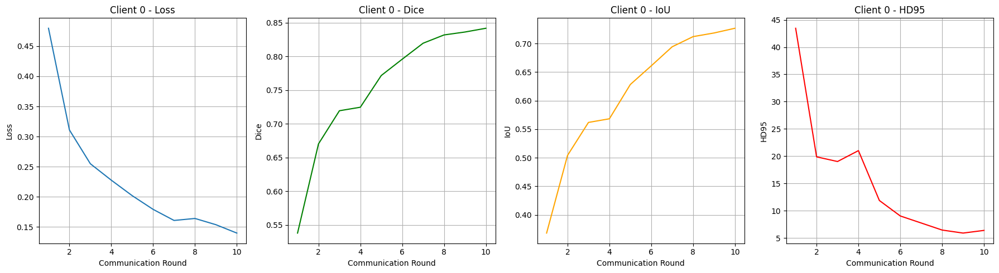

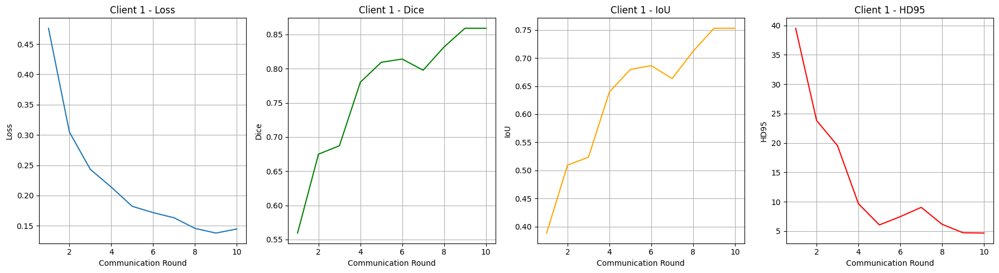

In [22]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

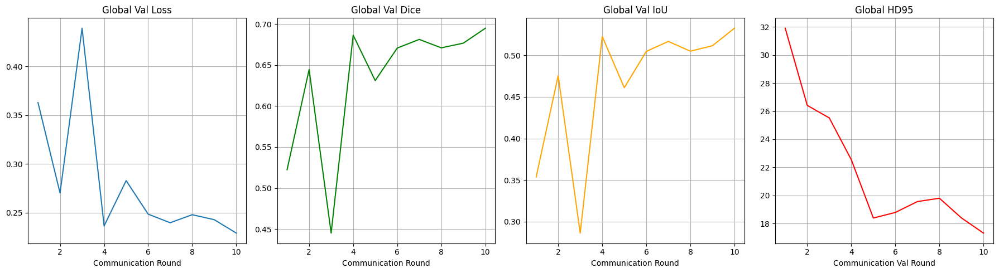

In [23]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [24]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    transform=transform,
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []


# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_11600\837846673.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth

Test samples: 29
Factorizer(
  (stem): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  (encoder): UNetEncoder(
    (blocks): ModuleList(
      (0): UNetEncoderBlock(
        (downsample): Identity()
        (block): FactorizerStage(
          (pos_embed): Identity()
          (blocks): ModuleList(
            (0): FactorizerBlock(
              (norm1): LayerNorm(
                (norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
              )
              (fact): FactMixer(
                (in_proj): Linear(
                  (flatten): Flatten(start_dim=2, end_dim=-1)
                  (linear): Conv1d(32, 32, kernel_size=(1,), stride=(1,), bias=False)
                )
                (reshape): SWMatricize(
                  (shifted_windows): ModuleList(
                    (0-1): 2 x Matricize(
                      (rearrange): Rearrange('b (h d) (g0 p0) (g1 p1) (g2 p2) -> (b h) (g0 g1 g2) d (p0 p1 p2)', d=8, p0=2, p1=2, p2=2)

Testing: 100%|██████████| 29/29 [00:18<00:00,  1.57it/s, Dice=0.6236, IoU=0.4530, HD95=28.9228]


Test Set Metrics:
Dice: 0.6236
IoU: 0.4530
HD95: 28.9228


**Visualize**

29


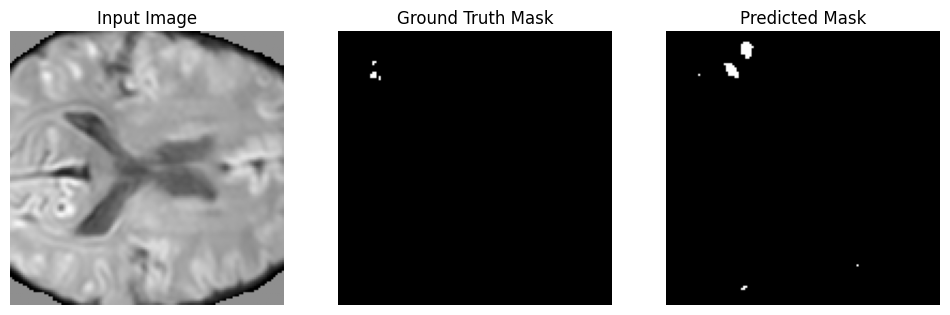

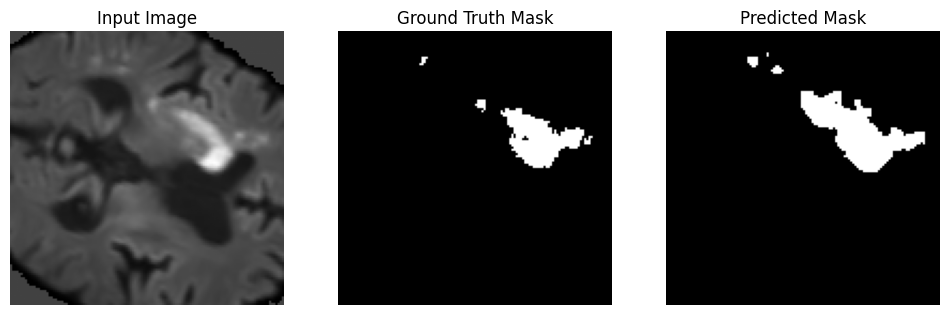

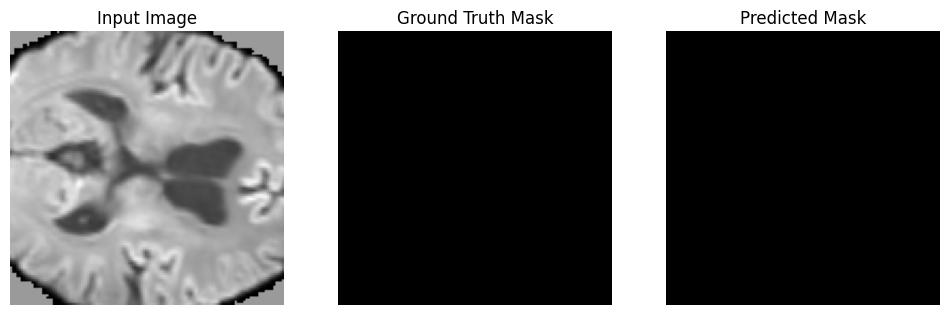

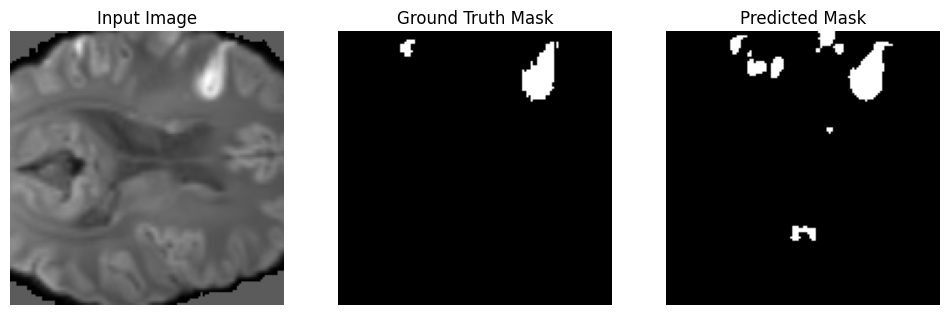

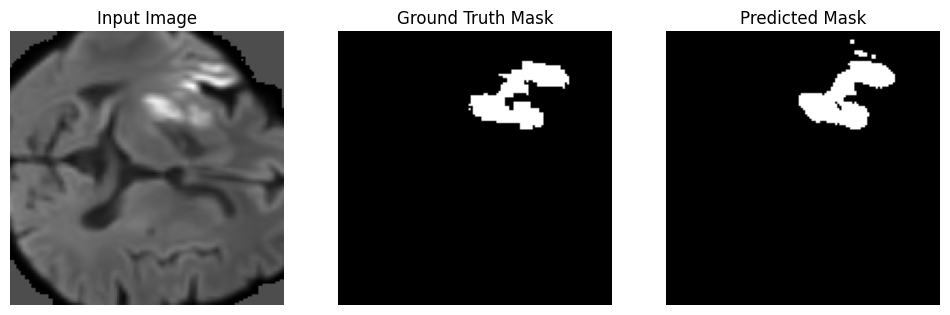

...

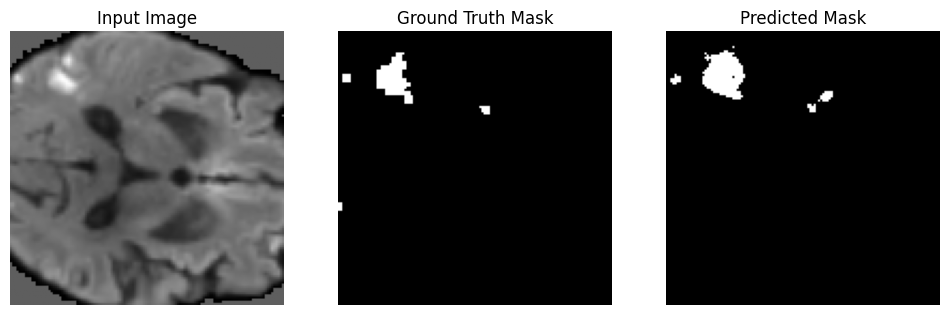

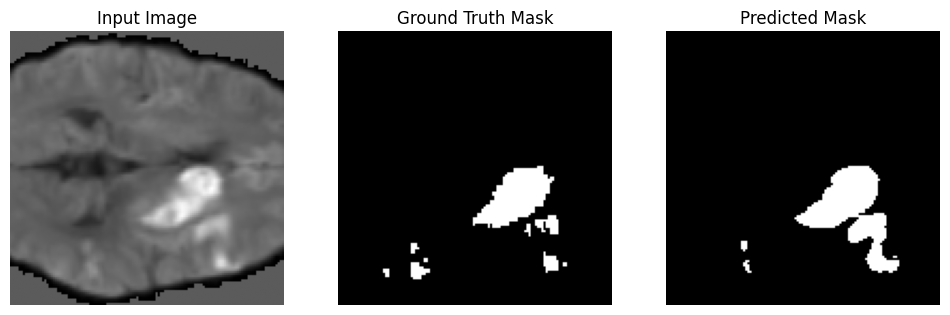

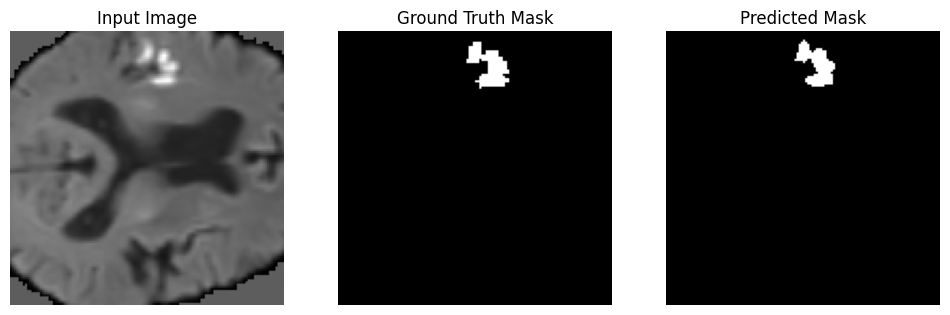

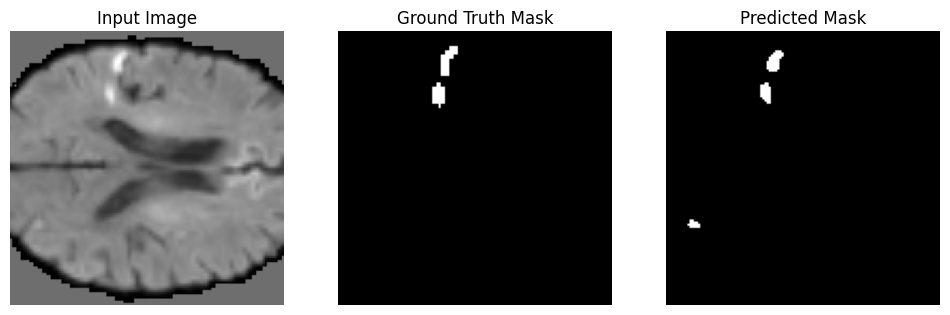

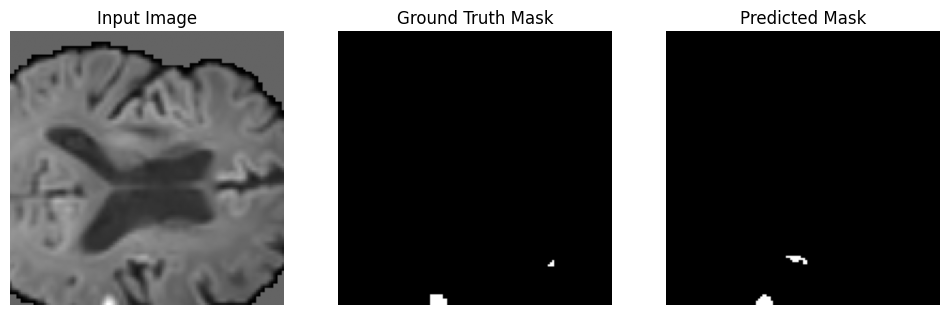

In [25]:
num_visualize = len(test_dataset)
print(num_visualize)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()